In [1]:
# Import Libraries
import numpy as np # vectors and matrices
import pandas as pd # tables and data manipulation
from datetime import datetime

import seaborn as sns # plots 
import matplotlib.pyplot as plt # more plots
from plotly.graph_objs.scatter.marker import Line # fix deprecated command
from plotly.graph_objs.layout.shape import Line

from scipy.optimize import minimize # function minimization

import statsmodels.formula.api as smf    # statistics        
import statsmodels.tsa.api as smt
import statsmodels.api as sm
import scipy.stats as scs

from itertools import product  # useful functions             
from tqdm import tqdm_notebook

# Set plots to a standard size
from pylab import rcParams

plt.rcParams['figure.figsize'] = [12, 8]
plt.rcParams['figure.dpi'] = 100


/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning:

pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.



In [57]:
# PJM East Region: 2001-2018 (PJME)
 
series = pd.read_csv('PJME_hourly.csv'
                     ,index_col =[0], parse_dates = [0] # set the index column as dates
                    )


PJM Interconnection LLC (PJM) is a regional transmission organization (RTO) in the United States. It is part of the Eastern Interconnection grid operating an electric transmission system serving all or parts of Delaware, Illinois, Indiana, Kentucky, Maryland, Michigan, New Jersey, North Carolina, Ohio, Pennsylvania, Tennessee, Virginia, West Virginia, and the District of Columbia.

We'll use the PJM East Region dataset - which covers the eastern states of the PJM area. There isn't readily available data that identifies which regions are covered, so I'm going to assume (for this analysis) the following States (the coastal ones):

1. Delaware
2. Maryland
3. New Jersey
4. North Carolina
5. Pennsylvania
6. Virginia
7. District of Columbia

Data : The dataset contains hourly data from 2002 up to 2018 on the power consumption from several companies including PJM.

# Preprocessing

In [3]:
def series_clean(series):
    
    # Sorting 
    series.sort_index(inplace = True)
    
    # Dropping duplicates
    series = series[~series.index.duplicated()]
    
    # Setting the frequency to Hourly
    series = series.asfreq('H')
    
    # Renaming the PJME_MW column to energy consumption (ec)
    series.rename(columns = {'PJME_MW' : 'ec'}, inplace = True)
    
    # Filling the Missing values using the preceding values
    series.ec = series.ec.fillna(method = 'ffill')
    
    return series

In [4]:
# Creating a new dataframe using the simple cleaning function
df = series_clean(series)
df.head()

,ec
Datetime,
2002-01-01 01:00:00,30393.0
2002-01-01 02:00:00,29265.0
2002-01-01 03:00:00,28357.0
2002-01-01 04:00:00,27899.0
2002-01-01 05:00:00,28057.0


In [5]:
# Check for missing values
df.isna().sum()

ec    0
dtype: int64

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 145392 entries, 2002-01-01 01:00:00 to 2018-08-03 00:00:00
Freq: H
Data columns (total 1 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   ec      145392 non-null  float64
dtypes: float64(1)
memory usage: 2.2 MB


In [7]:
df.describe()

,ec
count,145392.000000
mean,32079.051915
std,6464.154020
min,14544.000000
25%,27571.000000
50%,31420.000000
75%,35647.250000
max,62009.000000


In [8]:
# Extracting new features  for yearly, monthly, weekly, etc. 
def new_features(df):
    df['year'] = df.index.year
    df['month'] = df.index.month
    df['month_name'] = df.index.month_name()
    df['week_of_year'] = df.index.weekofyear
    df['quarter'] = df.index.quarter
    df['day_of_week'] = df.index.dayofweek
    df['day_of_week_name'] = df.index.day_name()
    df['day_of_month'] = df.index.day
    df['day_of_year'] = df.index.dayofyear
    df['hour'] = df.index.hour
    
    return df


In [9]:
# Applying the function and checking if it works
df1 = new_features(df)
df1.head()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: FutureWarning:

weekofyear and week have been deprecated, please use DatetimeIndex.isocalendar().week instead, which returns a Series.  To exactly reproduce the behavior of week and weekofyear and return an Index, you may call pd.Int64Index(idx.isocalendar().week)



,ec,year,month,month_name,week_of_year,quarter,day_of_week,day_of_week_name,day_of_month,day_of_year,hour
Datetime,,,,,,,,,,,
2002-01-01 01:00:00,30393.0,2002,1,January,1,1,1,Tuesday,1,1,1
2002-01-01 02:00:00,29265.0,2002,1,January,1,1,1,Tuesday,1,1,2
2002-01-01 03:00:00,28357.0,2002,1,January,1,1,1,Tuesday,1,1,3
2002-01-01 04:00:00,27899.0,2002,1,January,1,1,1,Tuesday,1,1,4
2002-01-01 05:00:00,28057.0,2002,1,January,1,1,1,Tuesday,1,1,5


In [10]:
# Grouping the EC with different frequency (yearly, monthly, weekly) to visualize 
df_year = df1.groupby('year')['ec'].sum()
df_month = df1.groupby('month_name', sort = False)['ec'].sum()
df_week_of_year = df1.groupby('week_of_year')['ec'].sum()
df_quarter = df1.groupby('quarter')['ec'].sum()
df_day_of_week = df1.groupby('day_of_week_name', sort = False)['ec'].sum()
df_day_of_month = df1.groupby('day_of_month')['ec'].sum()
df_day_of_year = df1.groupby('day_of_year')['ec'].sum()
df_hour = df1.groupby('hour')['ec'].sum()

Now that the DataFrames index has a date-time-index, we can explore the data and perform time series analysis. Will perform more pre-processing after some exploration if necessary. 

# Exploratory Data Analysis (EDA)

In [66]:
sns.set_style('whitegrid')
sns.set_context('talk')
rcParams['figure.figsize'] = 11.7,8.27

In [67]:
# interactive plots
import plotly.graph_objects as go                   
import plotly.express as px
from plotly.subplots import make_subplots

Text(0.5, 0, 'Hourly Energy Usage')

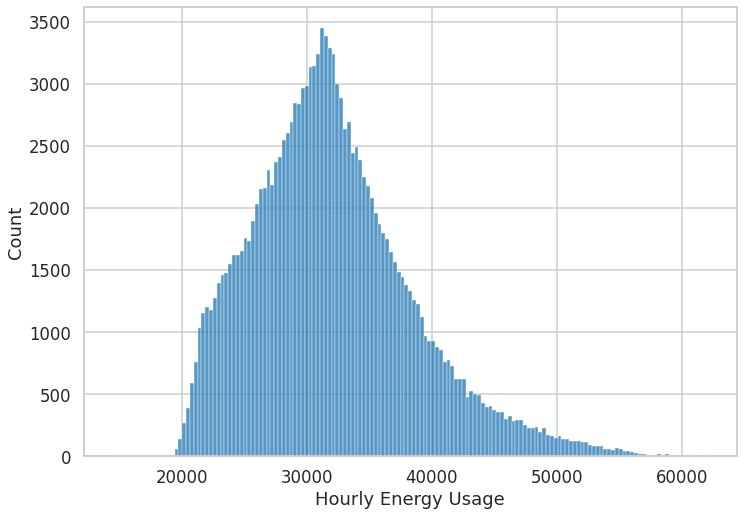

In [68]:

sns.histplot(series, legend = False)
plt.xlabel('Hourly Energy Usage')

Most of the energy usage is around 32,000(+ - 6000) MW. Skewed to the right somewhat

In [69]:
# Plotting the groupings created in the section above. 
# For yearly and quarterly
fig = make_subplots(rows=4, cols=1, vertical_spacing = 0.15,
                    subplot_titles=(['Year', 'Week of Year', 'Day of year', 'Quarter']))

fig.add_trace(go.Scatter(x=df_year.index, y = df_year), row=1, col=1)
fig.add_trace(go.Scatter(x=df_week_of_year.index, y=df_week_of_year), row=2, col=1)
fig.add_trace(go.Scatter(x=df_day_of_year.index, y=df_day_of_year), row=3, col=1)
fig.add_trace(go.Scatter(x=df_quarter.index, y=df_quarter), row=4, col=1)

fig.update_layout(title = 'Energy Consumption of PJME per', height = 800, showlegend = False)

fig.show()

In [70]:
# For Monthly, weekly, hourly
fig = make_subplots(rows=4, cols=1, vertical_spacing = 0.15,
                    subplot_titles=(['Month', 'Day of Week', 'Day of Month', 'Hour']))

fig.add_trace(go.Scatter(x=df_month.index, y=df_month), row=1, col=1)
fig.add_trace(go.Scatter(x=df_day_of_week.index, y=df_day_of_week), row=2, col=1)
fig.add_trace(go.Scatter(x=df_day_of_month.index, y=df_day_of_month), row=3, col=1)
fig.add_trace(go.Scatter(x=df_hour.index, y=df_hour), row=4, col=1)

fig.update_layout(title = 'Energy Consumption of PJME per', height = 800, showlegend = False)

fig.show()

Takeaways from the above visualizations: EC = energy consumption 
1. The yearly EC is constant up to 2015, a decreasing trend from 2015 to 2017. 
2. Monthly EC is high during the summer --peaking in July due to air conditioning? -- summers months should be closely monitored by the energy companies. Significantly high energy consumption between January and December perhaps due to holidays? . 
3. Day of the week, we can see that the energy consumption drops during weekends, perhaps because certain companies do not function during weekends that use up significant energy?
4. The hourly EC shows increase starting 6 A.M. to 8 P.M. (20 in military time) then predictably is at lowest during the "sleep" times.
5. Week of year, day of year, and quarterly EC show the same pattern as the monhtly distribution (i.e. highest during summer). 

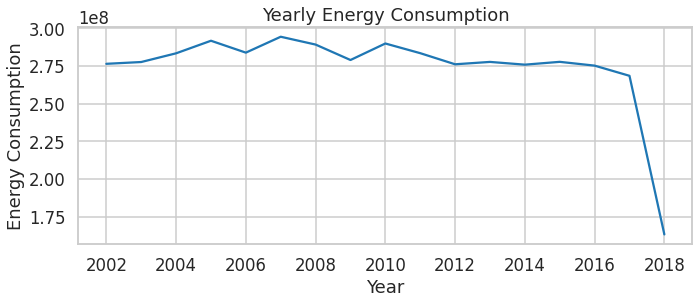

In [75]:
# Seaborn plots for presentation purposes for Yearly, Monthly, Daily, Hourly (total 4)

_ = plt.figure(figsize = [11,4])
_ = sns.lineplot(x=df_year.index, y = df_year)
_ = plt.title('Yearly Energy Consumption')
_ = plt.ylabel('Energy Consumption')
_ = plt.xlabel('Year')

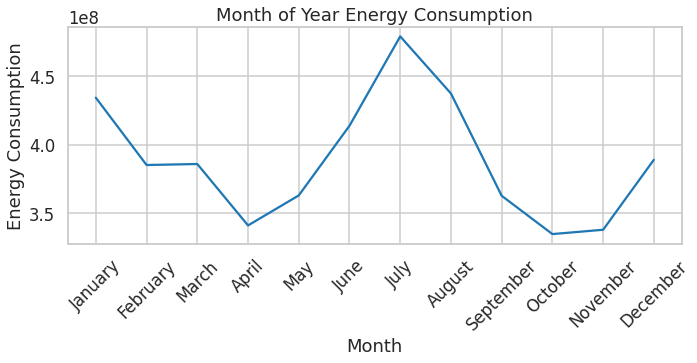

In [76]:
_ = plt.figure(figsize = [11,4])
_ = sns.lineplot(x=df_month.index, y=df_month)
_ = plt.title('Month of Year Energy Consumption')
_ = plt.ylabel('Energy Consumption')
_ = plt.xlabel('Month')
_ = plt.xticks(rotation = 45)

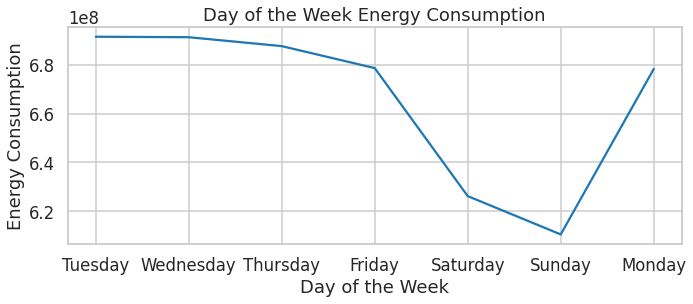

In [77]:
_ = plt.figure(figsize = [11,4])
_ = sns.lineplot(x=df_day_of_week.index, y=df_day_of_week)
_ = plt.title('Day of the Week Energy Consumption')
_ = plt.ylabel('Energy Consumption')
_ = plt.xlabel('Day of the Week')

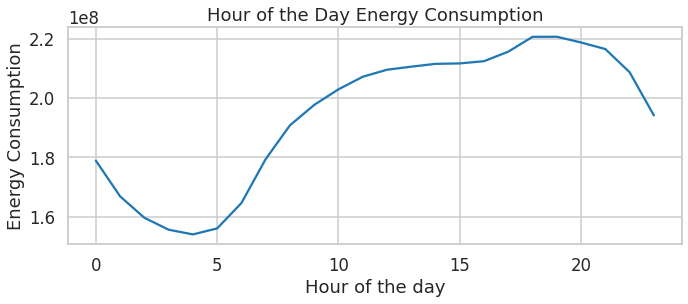

In [78]:
_ = plt.figure(figsize = [11,4])
_ = sns.lineplot(x=df_hour.index, y=df_hour)
_ = plt.title('Hour of the Day Energy Consumption')
_ = plt.ylabel('Energy Consumption')
_ = plt.xlabel('Hour of the day')

Text(0.5, 0, 'Day of the Week')

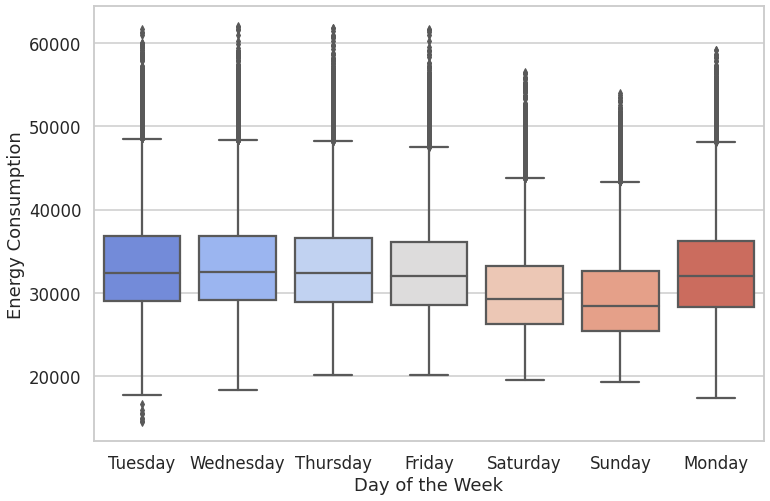

In [79]:
rcParams['figure.figsize'] = 12,8
sns.boxplot(data=df1, x='day_of_week_name', y='ec', palette = 'coolwarm')
plt.ylabel('Energy Consumption')
plt.xlabel('Day of the Week')

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11]),
 <a list of 12 Text major ticklabel objects>)

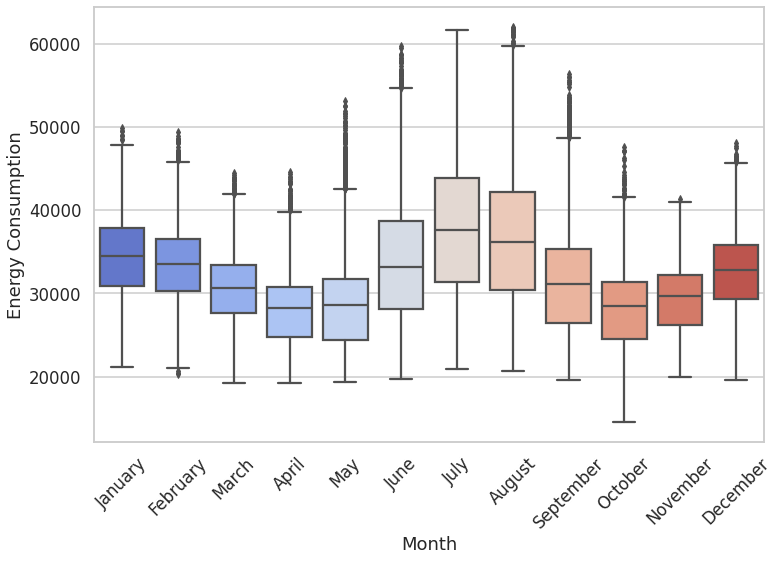

In [80]:
sns.boxplot(data=df1, x='month_name', y='ec', palette = 'coolwarm')
plt.ylabel('Energy Consumption')
plt.xlabel('Month')
plt.xticks(rotation = 45)

The boxplots confirm the higher energy consumption on 
1. Weekdays
2. Summer months (namely June and July) 

Additionally, we see a higher standard deviation in those months. 

# Hourly Energy Consumption Time Series

In [22]:
ax = px.line(df1, x = df1.index, y = df1.ec)

ax.update_layout(title = 'Energy Consumption  2002 - 2018 ',
                 yaxis_title = 'Energy (MegaWatts)',
                 xaxis_title = 'Date',
                 xaxis_rangeslider_visible = True)


We can see that the energy consumption at the end of Oct. 2012 is relatively low - Hurricate Sandy which caused significant destruction (70 billion USD). The remaining of the years look quite uniform in terms of their seasonality and peaks. 

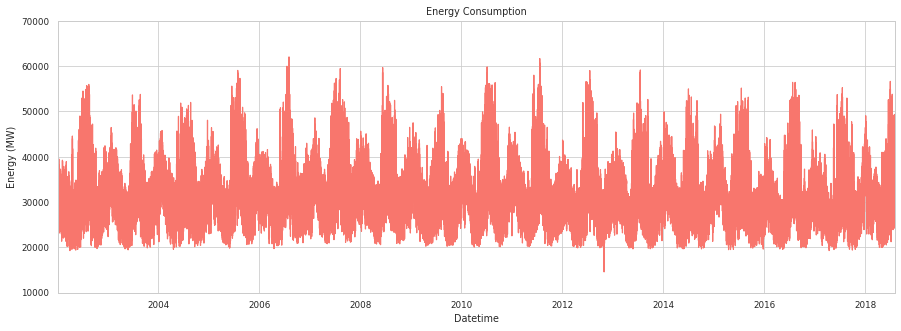

In [23]:
# Plot for presentation
_ = df1.plot(color ='#F8766D', figsize = (15,5), title = 'Energy Consumption', legend = False, ylim = (10000,70000))
_ = plt.ylabel('Energy (MW)')


In [24]:
# plt.figure(figsize = (18,5))
# sns.set_palette('Set2')
# sns.lineplot(df1.index, df1.ec)
# plt.title('Energy Consumption')
# plt.ylabel('Energy (MW)')


This time series analysis I will first decompose my data into its seasonal component, then check for stationarity

##### Seasonality 
is a characteristic of a time series in which the data experiences regular and predictable changes that recur every calendar year. Any predictable fluctuation or pattern that recurs or repeats over a specific period is said to be seasonal.

In [25]:
# Importing more libraries
from statsmodels.tsa.seasonal import seasonal_decompose

In [26]:
# We'll explore both additive and multiplicative models

In [28]:
# creating the periods
year_seasonality = int(24*365) # 24*365 = 8760 yearly seasonality
month_seasonality = int(24*30.5) # 24*30.5 = 732 monthly seasonality, 30.5 for different number of days in a month

#Yearly (additive + mult)
add_year = seasonal_decompose(df1.ec, freq=  year_seasonality, model = 'additive')
mult_year = seasonal_decompose(df1.ec, freq= year_seasonality, model = 'multiplicative')

#Monthly (additive + mult)
add_month = seasonal_decompose(df1[:year_seasonality].ec, freq = month_seasonality, model = 'additive')
mult_month = seasonal_decompose(df1[:year_seasonality].ec, freq = month_seasonality, model = 'multiplicative')

In [29]:
# After decomposing our series into trend + seasonality + residuals

The decomposition above will lead to 3 components 
1. Trend, which is the general direction of the data.
2. seasonal, which is the repeat pattern during specific intervals 
3. residuals, we will explore its autocorrelation later

#### Plotting the components

In [30]:
def plot_decomposition(r, axes, model):
    axes[0].set_title(model)
    r.observed.plot(ax=axes[0], legend=False) # plot observed
    axes[0].set_ylabel('Observed')
    r.trend.plot(ax=axes[1], legend=False)
    axes[1].set_ylabel('Trend')              # plot trend
    r.seasonal.plot(ax=axes[2], legend=False)
    axes[2].set_ylabel('Seasonal')           # plot seasonality
    r.resid.plot(ax=axes[3], legend=False)
    axes[3].set_ylabel('Residual')          # plot residual

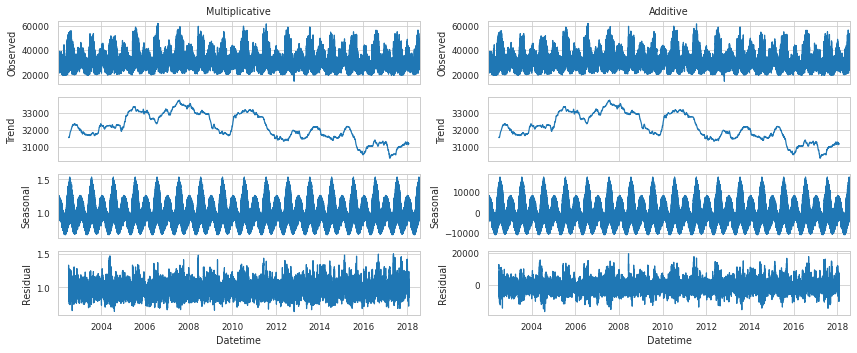

In [31]:
# Plotting Yearly seasonal decomposition using multi
fig, axes = plt.subplots(ncols = 2, nrows = 4, sharex = True, figsize = (12,5))

plot_decomposition(add_year, axes[:, 1], 'Additive')
plot_decomposition(mult_year, axes[:, 0], 'Multiplicative')

plt.tight_layout()
plt.show()

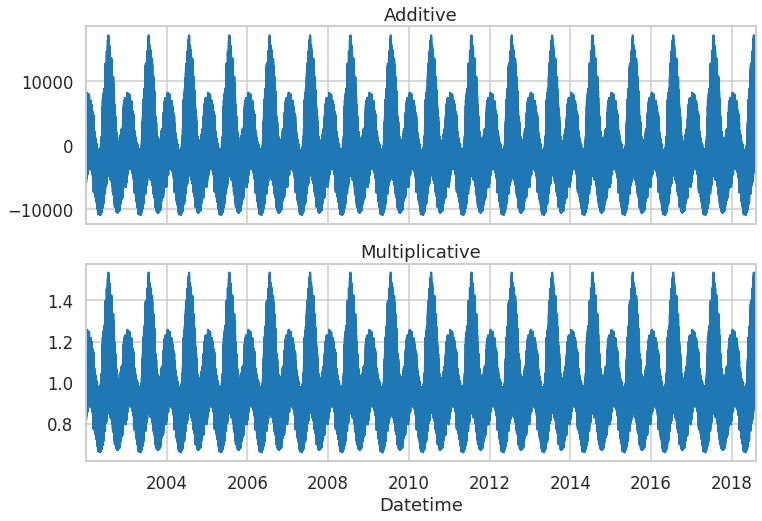

In [81]:
# Eyeing on the seasonal components
fig, ax = plt.subplots(2,1, sharex = True) # What arguments to add here ?
mult_year.seasonal.plot(ax = ax[1], title ='Multiplicative') # how to configure the axes ?
add_year.seasonal.plot(ax = ax[0], title = 'Additive')


We can see a seasonality for both models : 
We can conclude yearly seasonality

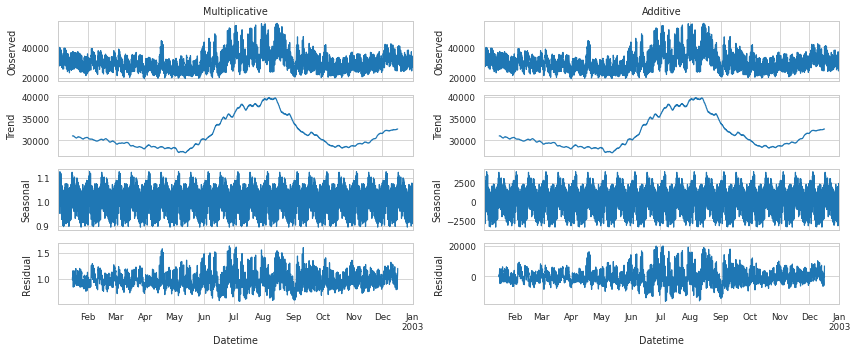

In [33]:
fig, axes = plt.subplots(ncols=2, nrows=4, sharex=True, figsize=(12,5))

plot_decomposition(add_month, axes[:,1], 'Additive')
plot_decomposition(mult_month, axes[:,0], 'Multiplicative')

plt.tight_layout()
plt.show()

We observe a monthly seasonality as well

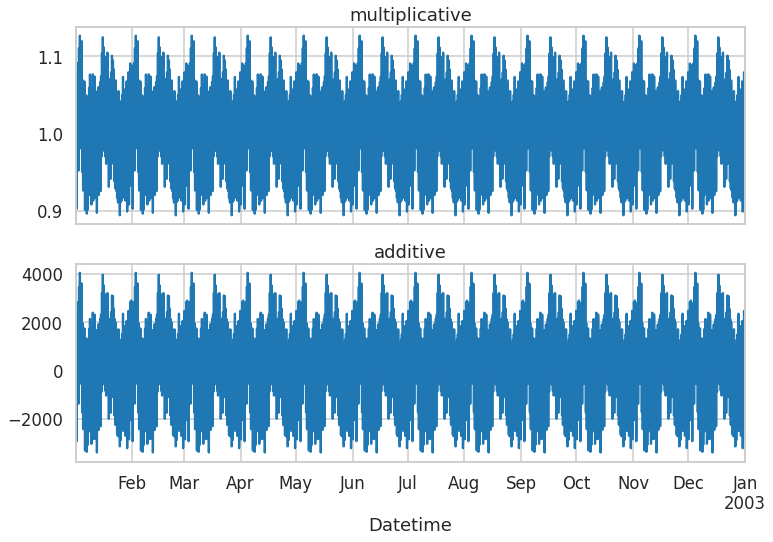

In [82]:
# Eyeing on the seasonality
fig, ax = plt.subplots(2,1, sharex = True) # What arguments to add here ?

mult_month.seasonal.plot(ax = ax[0], title = 'multiplicative') # how to configure the axes ?
add_month.seasonal.plot(ax = ax[1], title = 'additive')


For the purpose of this project I will be using Prophet and XGBoost which are both lenient on the seasonality component. The above is for my own analysis purposes. 

#### Stationarity
Definition : Intuitively, stationarity means that the statistical properties of the process do not change over time. 
This is an important assumption in a time series analysis. I will use Augmented Dickey Fuller test to ensure the data meets the stationarity assumption.



In [35]:
from statsmodels.tsa.stattools import adfuller 
# Running the ADF test
adfuller = adfuller(df1.ec)

test_value, critical_values = adfuller[0], adfuller[4]

# Printing the values
print(f'Test Value : \ t{test_value}\n Critical Values : \t{critical_values}')

Test Value : \ t-19.96832649137053
 Critical Values : 	{'1%': -3.4303950013454645, '5%': -2.8615598899580115, '10%': -2.5667805867167433}


Null hypothesis : unit root is present in the time series sample
Alternative hypothesis : our sample is stationary

Since our test value is lower than our critical value of 1% (where alpha = 0.01), we reject the null hypothesis.
Thus our data is stationary

# Forecasting

In [36]:
# Splitting the data into training and testing sets (80/20)
# Split Function
# def data_split(df, length):
#     return df[:length], df[length:]
# # Defining training size
# length = int(0.80 * len (df1))
# # Creating train, test
# train, test = data_split(df1, length)  

# train_hours = len(train)
# test_hours = len(test)



In [83]:
# Approxitaley 80/20 split 3 years is appoximately 20% of 16 years. 
split_date = '01-Jan-2015'
train = df1.loc[df1.index <= split_date].copy()
test = df1.loc[df1.index > split_date].copy()

In [84]:
print(f'{str(train.ec.tail())} \n\n {str(train.ec.head())}')

Datetime
2014-12-31 20:00:00    37772.0
2014-12-31 21:00:00    36602.0
2014-12-31 22:00:00    35326.0
2014-12-31 23:00:00    34003.0
2015-01-01 00:00:00    32802.0
Freq: H, Name: ec, dtype: float64 

 Datetime
2002-01-01 01:00:00    30393.0
2002-01-01 02:00:00    29265.0
2002-01-01 03:00:00    28357.0
2002-01-01 04:00:00    27899.0
2002-01-01 05:00:00    28057.0
Freq: H, Name: ec, dtype: float64


In [85]:
print(f'{str(test.ec.tail())} \n\n {str(test.ec.head())}')

Datetime
2018-08-02 20:00:00    44057.0
2018-08-02 21:00:00    43256.0
2018-08-02 22:00:00    41552.0
2018-08-02 23:00:00    38500.0
2018-08-03 00:00:00    35486.0
Freq: H, Name: ec, dtype: float64 

 Datetime
2015-01-01 01:00:00    31647.0
2015-01-01 02:00:00    30755.0
2015-01-01 03:00:00    30189.0
2015-01-01 04:00:00    29890.0
2015-01-01 05:00:00    30075.0
Freq: H, Name: ec, dtype: float64


In [86]:
fig = make_subplots()

fig.add_trace(go.Line(x = train.index, y = train.ec, name = "Train"))
fig.add_trace(go.Line(x = test.index, y = test.ec, name = 'Test'))

fig.update_layout(title = 'Energy Consumption (Train/Test)',
                  yaxis_title = 'Energy(MW)',
                  xaxis_title = 'Date',
                  xaxis_rangeslider_visible = True
                 )



/usr/local/lib/python3.6/dist-packages/plotly/graph_objs/_deprecations.py:385: DeprecationWarning:

plotly.graph_objs.Line is deprecated.
Please replace it with one of the following more specific types
  - plotly.graph_objs.scatter.Line
  - plotly.graph_objs.layout.shape.Line
  - etc.




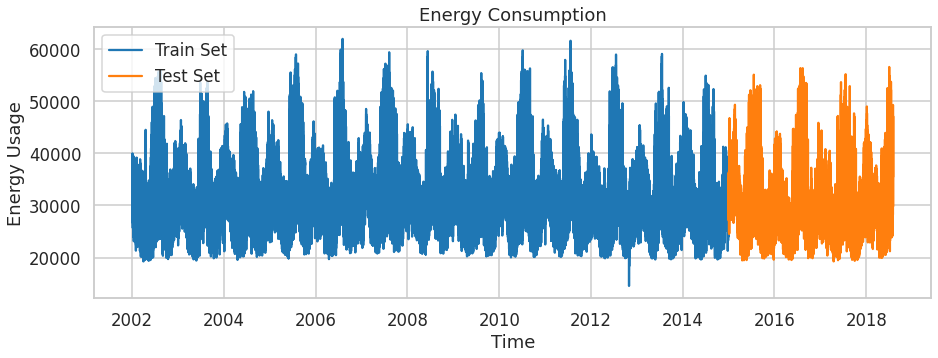

In [87]:
# Train/test set look good

plt.figure(figsize=(15,5))
plt.xlabel('Time')
plt.ylabel('Energy Usage')
plt.title('Energy Consumption')
plt.plot(train.index,train.ec, label = 'Train Set')
plt.plot(test.index,test.ec, label = 'Test Set')
plt.legend()
plt.show()

 # Machine Learning

In [88]:
# Import libraries for modeling
import xgboost as xgb
from xgboost import plot_importance, plot_tree
from sklearn.metrics import mean_squared_error, mean_absolute_error

### XGBoost

In [89]:
# Data Prep
features = ['year', 'month', 'week_of_year', 'quarter', 'day_of_week', 'day_of_month', 'day_of_year', 'hour']
# Splitting target and features for test/train
X_train, y_train = train[features], train['ec']
X_test, y_test = test[features], test['ec']

In [90]:
# Fitting XGB regressor 
reg_xgb = xgb.XGBRegressor()
reg_xgb.fit(X_train, y_train,
            eval_set = [(X_train, y_train), (X_test, y_test)],
            early_stopping_rounds = 50, verbose = False)
print(reg_xgb)

[02:02:26] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0,
             importance_type='gain', learning_rate=0.1, max_delta_step=0,
             max_depth=3, min_child_weight=1, missing=None, n_estimators=100,
             n_jobs=1, nthread=None, objective='reg:linear', random_state=0,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
             silent=None, subsample=1, verbosity=1)


##### Feature Importance
Get an idea of what is the model relying on the most to make the prediction. We can see that day of the year was the most important feature in splitting the trees.

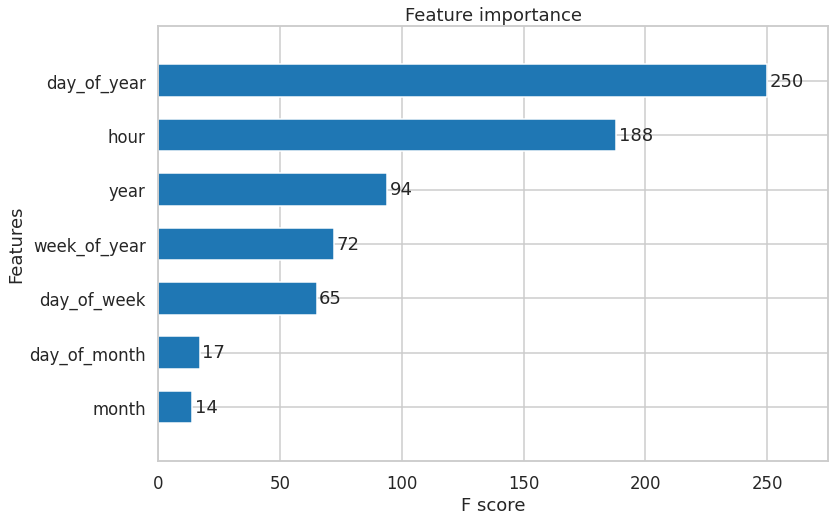

In [91]:
_ = plot_importance(reg_xgb, height = 0.6)

In [92]:
# Predicting on the test set
test['EC_Prediction'] = reg_xgb.predict(X_test)
test_all = pd.concat([test, train], sort=False)

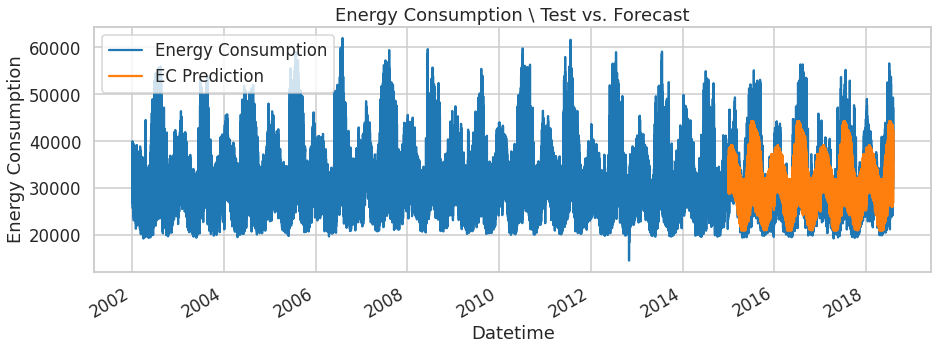

In [104]:
_ = test_all[['ec','EC_Prediction']].plot(figsize=(15, 5), title = 'Energy Consumption \ Test vs. Forecast')
_ = plt.ylabel('Energy Consumption')
_ = plt.legend(['Energy Consumption', 'EC Prediction'], loc = 'upper left')


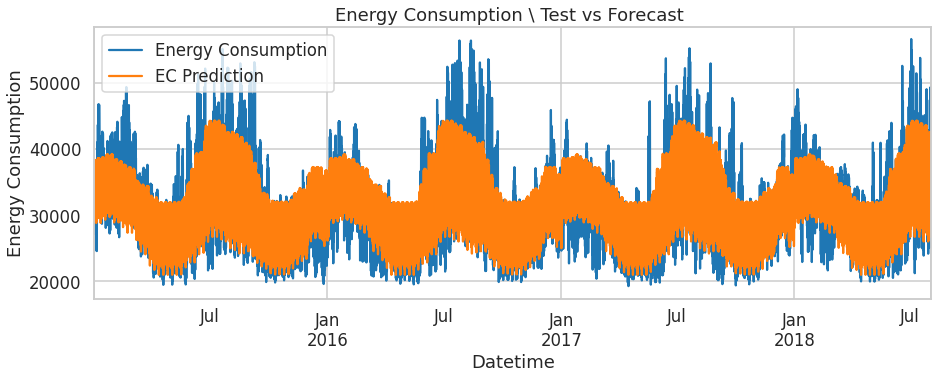

In [105]:
_ = test[['ec','EC_Prediction']].plot(figsize=(15, 5), title ='Energy Consumption \ Test vs Forecast ')
_ = plt.ylabel('Energy Consumption')
_ = plt.legend(['Energy Consumption', 'EC Prediction'], loc = 'upper left')

We see that our XGBoost model fits the test data quite well. We'll run evaluation metrics later on to pick the best model.

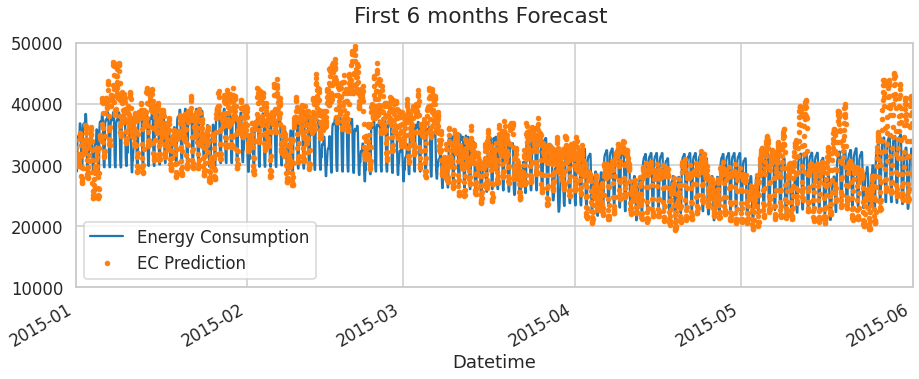

In [108]:
# Look at just the first 6 months
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
_ = test_all[['EC_Prediction','ec']].plot(ax=ax,style=['-','.'])
_ = plt.legend(['Energy Consumption', 'EC Prediction'], loc = 'lower left')
ax.set_xbound(lower='01-01-2015', upper='06-01-2015')
ax.set_ylim(10000, 50000)
plot = plt.suptitle('First 6 months Forecast')

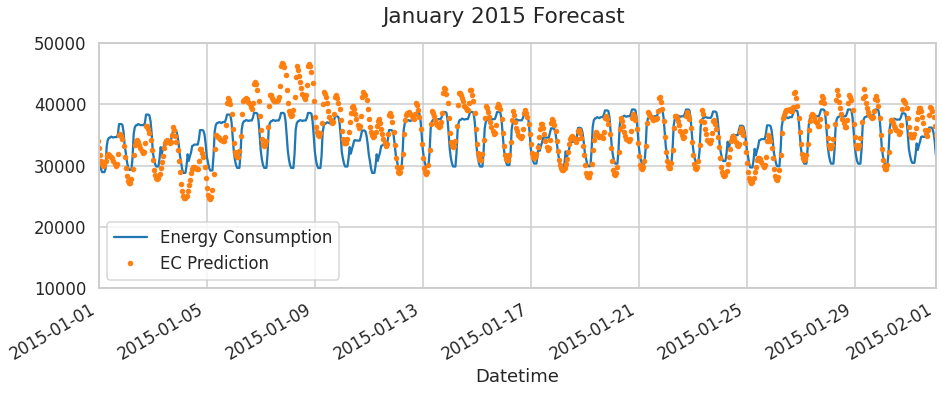

In [109]:
# Take a closer look at the forecast vs actuals for the first month

f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
_ = test_all[['EC_Prediction', 'ec']].plot(ax = ax, style = ['-', '.'])
_ = plt.legend(['Energy Consumption', 'EC Prediction'], loc = 'lower left')
ax.set_xbound(lower = '01-01-2015', upper = '02-01-2015')
ax.set_ylim(10000, 50000)
plot = plt.suptitle('January 2015 Forecast')

The model does a good job following the general pattern; however, outlying parts between 5th and 13th is poorly reflected. This is not an issue though because we do not want to overfit our model. 

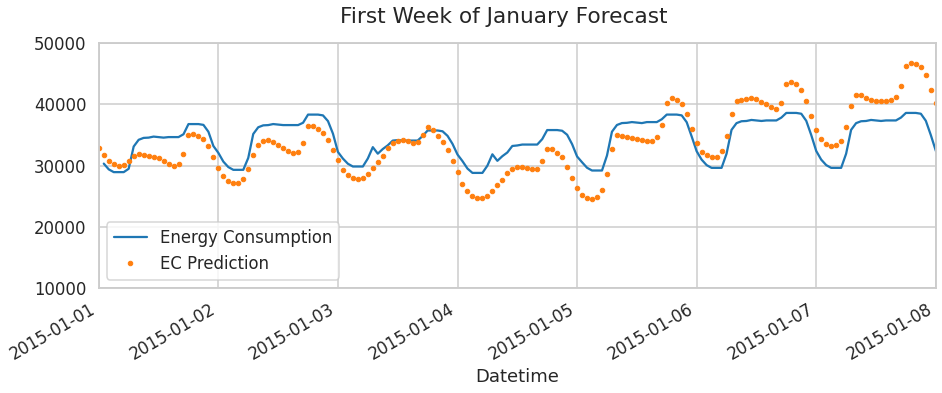

In [110]:
# Look at just the first week of January
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
_ = test_all[['EC_Prediction','ec']].plot(ax=ax,style=['-','.'])
_ = plt.legend(['Energy Consumption', 'EC Prediction'], loc = 'lower left')
ax.set_xbound(lower='01-01-2015', upper='01-08-2015')
ax.set_ylim(10000, 50000)
plot = plt.suptitle('First Week of January Forecast')

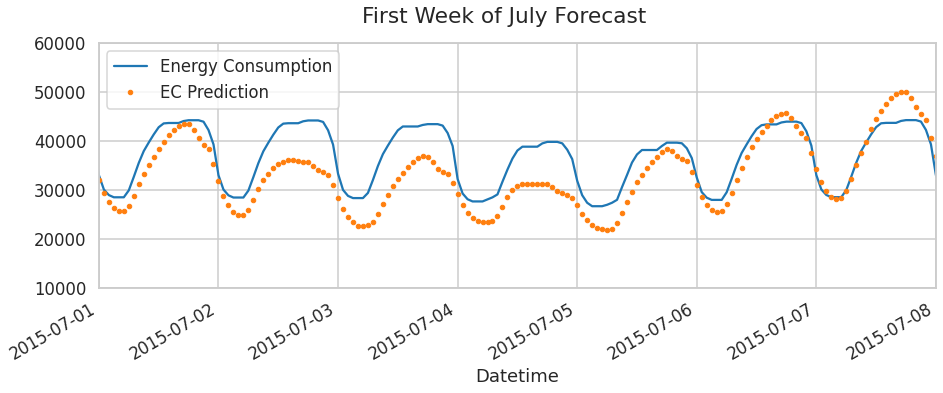

In [115]:
# Look at the first week of the hottest month (most energy consumed)
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
_ = test_all[['EC_Prediction','ec']].plot(ax=ax,style=['-','.'])
_ = plt.legend(['Energy Consumption', 'EC Prediction'], loc = 'upper left')
ax.set_ylim(10000, 60000)
ax.set_xbound(lower='07-01-2015', upper='07-08-2015')
plot = plt.suptitle('First Week of July Forecast')

Relatively good job on forecasting for July's first week, which is an important month as far as EC goes. 

#### Metrics for XGBoost

Some common error metrics are:

Mean Squared Error (MSE)
Root Mean Square Error (RMSE)
Mean Absolute Error (MAE)
Mean Absolute Percentage Error (MAPE)

I will use RMSE, MSE, and MAE to evaluate my models

In [99]:
# Define functions for the RMSE
def mean_absolute_percentage_error(y_true, y_pred):
    
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

def print_err(y_true, y_pred):
    print('Mean Sq. Error   :\t', round(mean_squared_error(y_true, y_pred), 3))
    print('Root Mean Sq. Error  :\t', round(np.sqrt(mean_squared_error(y_true, y_pred)), 3))
    print('Mean Absolute Error   :\t', round(mean_absolute_error(y_true, y_pred), 3))
    print('Mean Abs Perc. Error  :\t', round(mean_absolute_percentage_error(y_true, y_pred), 3), '%')

In [100]:
# Defining actual and predicted values
y_true = test['ec']
y_pred_xgb = test['EC_Prediction']


In [101]:
print_err(y_true, y_pred_xgb)

Mean Sq. Error   :	 14031775.344
Root Mean Sq. Error  :	 3745.901
Mean Absolute Error   :	 2892.67
Mean Abs Perc. Error  :	 9.108 %


### Prophet

In [102]:
# Import libraries
from fbprophet import Prophet